# Feature engineering

Convert categorical variable, scaling and identify feature importance

In [54]:
pip install category_encoders

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\chama\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [55]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\chama\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [56]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\chama\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [57]:
# Laod libraries

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from category_encoders.ordinal import OrdinalEncoder
from sklearn.metrics import mean_squared_error,r2_score

sns.set_context("talk")

In [94]:
# load data and remove unneccessary columns. Set date as the index

nurse_df = pd.read_csv('data/eng_workforce_master_updated.csv')

nurse_tidy = nurse_df.drop(["org_name", "nhse_region_name", "ics_name", "hc_lag1",
                            "hc_leavers_lag2", "hc_leavers_lag3", "hc_leavers_lag4",
                            "hc_joiners_lag2", "hc_joiners_lag3", "hc_joiners_lag4",
                             "MHS32_lag2","MHS32_lag3",
                             "MHS01_lag2", "MHS01_lag3",
                             "MHS07_lag2", "MHS07_lag3",
                             "MHS29_lag2", "MHS29_lag3",

                             "MHS32_low_lag2","MHS32_low_lag3",
                             "MHS01_low_lag2", "MHS01_low_lag3",
                             "MHS07_low_lag2", "MHS07_low_lag3",
                             "MHS29_low_lag2", "MHS29_low_lag3",

                             "MHS32_high_lag2","MHS32_high_lag3",
                             "MHS01_high_lag2", "MHS01_high_lag3",
                             "MHS07_high_lag2", "MHS07_high_lag3",
                             "MHS29_high_lag2", "MHS29_high_lag3",

                             "ucas_acceptance_lag1", "ucas_acceptance_lag2", "ucas_acceptance_lag3"], axis = 1)

nurse_tidy['date'] = nurse_tidy['date'].apply(pd.to_datetime)

In [ ]:
# convert datetime to end-of-month

nurse_tidy = nurse_tidy.set_index("date")

nurse_tidy.index = nurse_tidy.index.to_period('M').to_timestamp('M')

nurse_tidy = nurse_tidy.reset_index()

nurse_tidy

,date,year,month,org_code,nhse_region_code,ics_code,hc,hc_leavers,hc_joiners,hc_leavers_lag1,...,MHS01_low_lag1,MHS07_high,MHS07_low,MHS07_high_lag1,MHS07_low_lag1,MHS29_high,MHS29_low,MHS29_high_lag1,MHS29_low_lag1,covid_index
0,2018-07-31,2018,7,R1L,Y61,QH8,1483,19.000000,8.000000,0.000000,...,28145.000000,550.000000,550.000000,555.000000,555.000000,35670.000000,35670.000000,34880.000000,34880.000000,0
1,2018-07-31,2018,7,RAT,Y56,QMF,1832,18.000000,23.000000,0.000000,...,36180.000000,220.000000,220.000000,230.000000,230.000000,59050.000000,59050.000000,57740.000000,57740.000000,0
2,2018-07-31,2018,7,RDY,Y58,QVV,1698,17.000000,6.000000,0.000000,...,15440.000000,340.000000,340.000000,340.000000,340.000000,27705.000000,27705.000000,27695.000000,27695.000000,0
3,2018-07-31,2018,7,RGD,Y63,QWO,715,6.000000,9.000000,0.000000,...,15685.000000,355.000000,355.000000,350.000000,350.000000,29535.000000,29535.000000,27495.000000,27495.000000,0
4,2018-07-31,2018,7,RHA,Y60,QT1,2570,23.000000,11.000000,0.000000,...,21815.000000,860.000000,860.000000,865.000000,865.000000,35495.000000,35495.000000,35555.000000,35555.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5665,2028-12-31,2028,12,RXV,Y62,QOP,0,11.997386,38.868463,26.038160,...,34947.478031,1130.830684,1066.577231,1152.414579,1088.161126,118920.060951,109016.224665,129320.888285,119417.051999,0
5666,2028-12-31,2028,12,RXX,Y59,QXU,0,9.186565,11.129800,9.234847,...,36064.803439,122.588318,116.665816,120.531753,114.609251,29449.005157,15162.237190,33785.290983,19498.523016,0
5667,2028-12-31,2028,12,RXY,Y59,QKS,0,14.963166,15.299166,14.565710,...,20004.099507,298.533704,233.359037,289.518539,224.343871,50800.023249,46043.362915,63130.762792,58374.102458,0
5668,2028-12-31,2028,12,RYG,Y60,QWU,0,17.787330,22.394072,18.160520,...,-4248.434706,105.336241,9.509253,103.279676,7.452689,25762.424223,18308.031428,30916.104792,23461.711996,0


In [96]:
# convert categorical features - for ML models

# Set up the ordinal encoder

o_enc = OrdinalEncoder()

o_enc.fit(nurse_tidy)

,verbose,0
,mapping,"[{'col': 'org_code', 'data_type': dtype('O'), 'mapping': R1L 1 RAT...2 dtype: int64}, {'col': 'nhse_region_code', 'data_type': dtype('O'), 'mapping': Y61 1 Y56 ...2 dtype: int64}, ...]"
,cols,"['org_code', 'nhse_region_code', ...]"
,drop_invariant,False
,return_df,True
,handle_unknown,'value'
,handle_missing,'value'


In [97]:
# Category encoders's finds categorical variables

o_enc.cols

['org_code', 'nhse_region_code', 'ics_code']

In [98]:
# Category encoders's encoder replaces the categories
# with integers, in place, returning a dataframe with the original
# and encoded variables, by default.

nurse_tidy_t = o_enc.transform(nurse_tidy)

nurse_tidy_t.head()

,date,year,month,org_code,nhse_region_code,ics_code,hc,hc_leavers,hc_joiners,hc_leavers_lag1,...,MHS01_low_lag1,MHS07_high,MHS07_low,MHS07_high_lag1,MHS07_low_lag1,MHS29_high,MHS29_low,MHS29_high_lag1,MHS29_low_lag1,covid_index
0,2018-07-31,2018,7,1,1,1,1483,19.0,8.0,0.0,...,28145.0,550.0,550.0,555.0,555.0,35670.0,35670.0,34880.0,34880.0,0
1,2018-07-31,2018,7,2,2,2,1832,18.0,23.0,0.0,...,36180.0,220.0,220.0,230.0,230.0,59050.0,59050.0,57740.0,57740.0,0
2,2018-07-31,2018,7,3,3,3,1698,17.0,6.0,0.0,...,15440.0,340.0,340.0,340.0,340.0,27705.0,27705.0,27695.0,27695.0,0
3,2018-07-31,2018,7,4,4,4,715,6.0,9.0,0.0,...,15685.0,355.0,355.0,350.0,350.0,29535.0,29535.0,27495.0,27495.0,0
4,2018-07-31,2018,7,5,5,5,2570,23.0,11.0,0.0,...,21815.0,860.0,860.0,865.0,865.0,35495.0,35495.0,35555.0,35555.0,0


In [99]:
# Scaling data

nurse_scale = nurse_tidy_t.drop(nurse_tidy_t.iloc[:, 44:61],axis = 1)

nurse_scale

,date,year,month,org_code,nhse_region_code,ics_code,hc,hc_leavers,hc_joiners,hc_leavers_lag1,...,age_45_49,age_50_54,age_55_59,age_60_64,SFTN,IFTN,ucas_acceptance_rate,ucas_acceptance_lag4,international_joiners_mental_health,time_window
0,2018-07-31,2018,7,1,1,1,1483,19.000000,8.000000,0.000000,...,4227170,4360366,3976862,3391759,14.90,500.750000,-12.500000,21.670000,13,0
1,2018-07-31,2018,7,2,2,2,1832,18.000000,23.000000,0.000000,...,596141,564205,479470,378068,14.90,500.750000,4.170000,0.000000,13,0
2,2018-07-31,2018,7,3,3,3,1698,17.000000,6.000000,0.000000,...,373652,402594,379723,338670,14.90,500.750000,15.790000,14.290000,13,0
3,2018-07-31,2018,7,4,4,4,715,6.000000,9.000000,0.000000,...,542641,571347,541354,473053,14.90,500.750000,17.320000,-6.000000,13,0
4,2018-07-31,2018,7,5,5,5,2570,23.000000,11.000000,0.000000,...,725636,752739,688304,590748,14.90,500.750000,0.000000,10.320000,13,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5665,2028-12-31,2028,12,41,7,17,0,11.997386,38.868463,26.038160,...,460236,416288,487126,498320,17.15,1037.247826,37.695996,37.572765,44,125
5666,2028-12-31,2028,12,42,6,33,0,9.186565,11.129800,9.234847,...,624565,583068,629188,635383,17.15,1037.247826,37.700745,37.700745,44,125
5667,2028-12-31,2028,12,43,6,34,0,14.963166,15.299166,14.565710,...,624565,583068,629188,635383,17.15,1037.247826,37.700745,37.700745,44,125
5668,2028-12-31,2028,12,44,5,35,0,17.787330,22.394072,18.160520,...,687276,629911,728994,740441,17.15,1037.247826,59.798953,59.798953,44,125


In [100]:
## #Train and Test data set

# I use 2018 Jun - 2022 Dec as the training set

train = nurse_scale[nurse_scale['year'] <= 2022]

val = nurse_scale[nurse_scale['year'] > 2022]

pred = val

In [101]:
## drop forecasting variable

X_train = train.drop(['hc', 'date'], axis = 1)
y_train = train['hc']

features = X_train.columns

X_test = val.drop(['hc', 'date'], axis = 1)
y_test = val["hc"]

In [102]:
# Create the data matrix and target variable
# We standardise the features and target so
# we can use LASSO for feature selection

y = y_train

X = StandardScaler().fit_transform(X_train)


C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.246e+07, tolerance: 1.027e+05
  model = cd_fast.enet_coordinate_descent(


<Axes: >

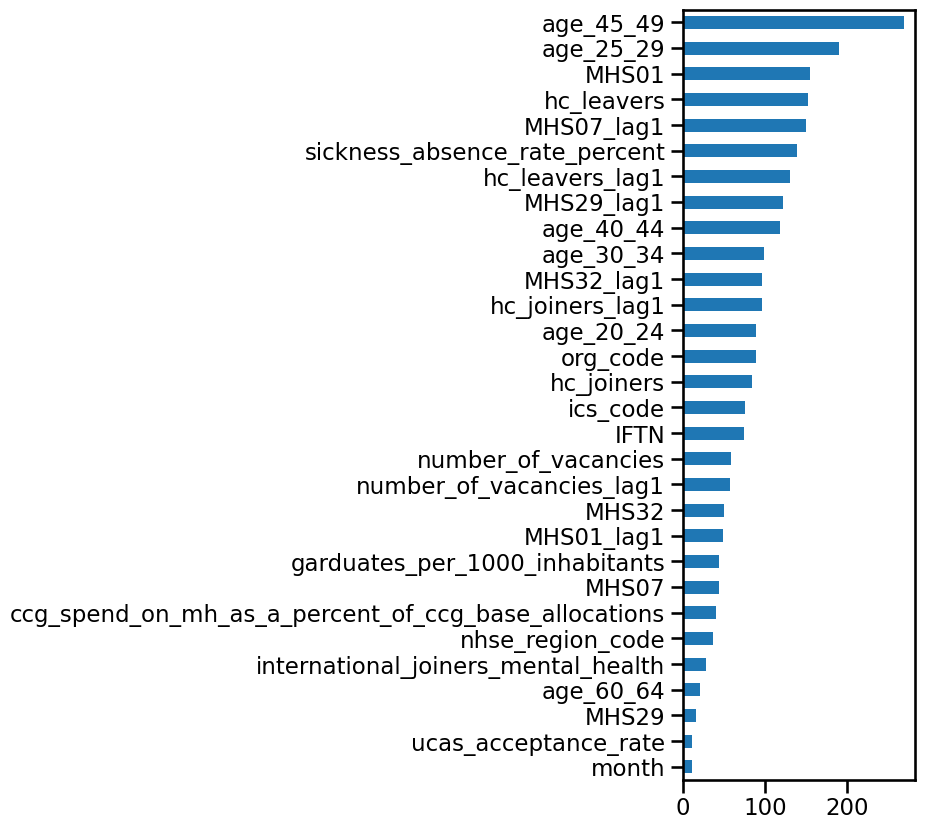

In [103]:
# Now let's use LASSO

model = Lasso(alpha = 0.1)

model.fit(X, y)

feat_importances = pd.Series(index=features, data=model.coef_)

feat_importances.abs().nlargest(30).iloc[::-1].plot(kind="barh", figsize=(3, 10))

In [104]:
print('R squared training set', round(model.score(X, y)*100, 2))

R squared training set 62.77


C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.806e+08, tolerance: 1.027e+05
  model = cd_fast.enet_coordinate_descent(
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.704e+08, tolerance: 1.027e+05
  model = cd_fast.enet_coordinate_descent(
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the sca

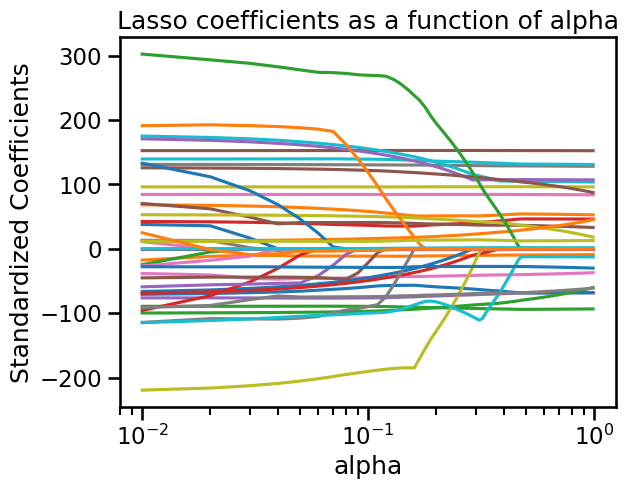

In [105]:
## coefficients in Lasso regression may vary according to the determined alpha parameter

# Coefficients for different lambda values.

alphas = [x / 100.0 for x in range(1, 100, 1)]
lasso = Lasso(max_iter=1000)
coefs = []

for a in alphas:
    lasso.set_params(alpha=a)
    lasso.fit(X, y)
    coefs.append(lasso.coef_)

ax = plt.gca()

ax.plot(alphas, coefs)
ax.set_xscale('log')
plt.axis('tight')
plt.xlabel('alpha')
plt.ylabel('Standardized Coefficients')
plt.title('Lasso coefficients as a function of alpha');

In [106]:
## cross validation to get the best alpha

from sklearn.linear_model import LassoCV

# Lasso with 5 fold cross-validation
model = LassoCV(cv=5, random_state=0, max_iter=1000)

# Fit model
model.fit(X, y)

LassoCV(cv=5, max_iter=1000, random_state=0)

model.alpha_

C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.385e+05, tolerance: 8.224e+04
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.311e+05, tolerance: 8.224e+04
  model = cd_fast.enet_coordinate_descent_gram(
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:681: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, che

np.float64(33.456857543401505)

In [107]:
## Best lasso model

lasso_best = Lasso(alpha=model.alpha_)

lasso_best.fit(X, y)

,alpha,np.float64(33.456857543401505)
,fit_intercept,True
,precompute,False
,copy_X,True
,max_iter,1000
,tol,0.0001
,warm_start,False
,positive,False
,random_state,None
,selection,'cyclic'


<Axes: >

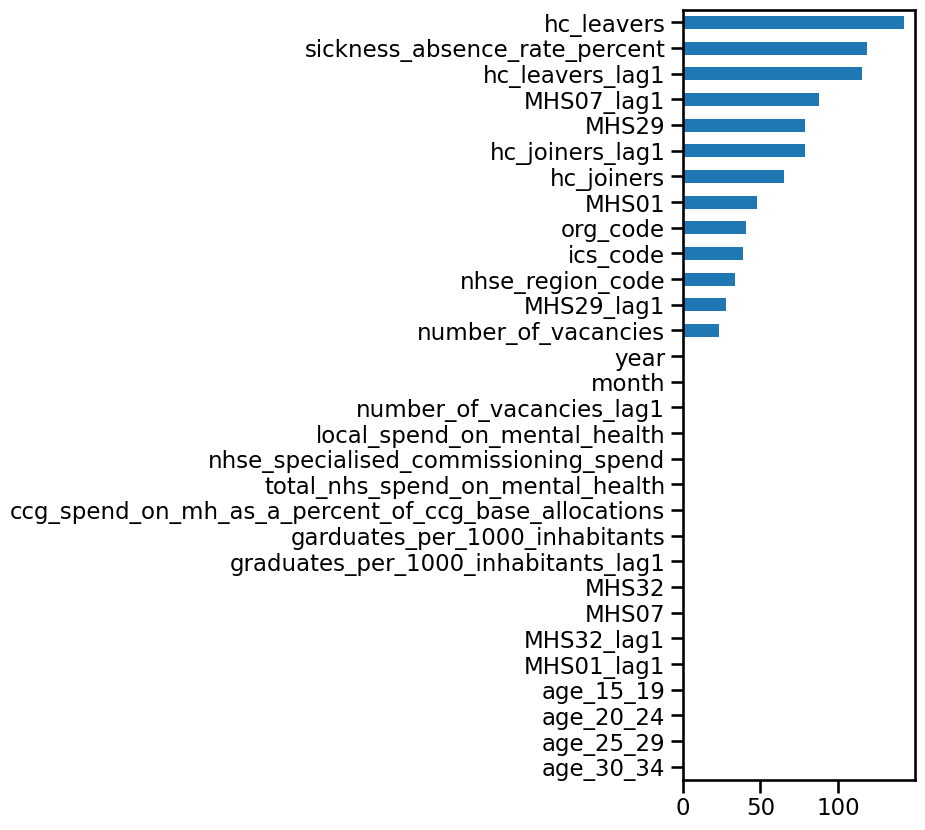

In [108]:
## Feature importance

feat_importances = pd.Series(index=features, data=lasso_best.coef_)

feat_importances.abs().nlargest(30).iloc[::-1].plot(kind="barh", figsize=(3, 10))

In [109]:
## Model evaluation

print('R squared training set', round(lasso_best.score(X, y)*100, 2))

R squared training set 59.04


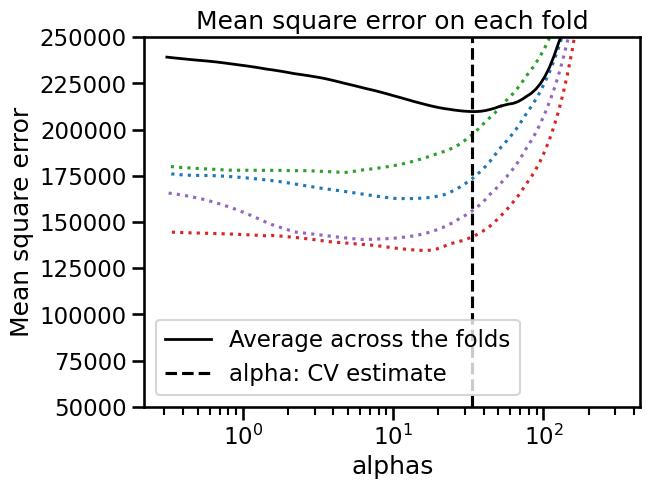

In [110]:
plt.semilogx(model.alphas_, model.mse_path_, ":")
plt.plot(
    model.alphas_ ,
    model.mse_path_.mean(axis=-1),
    "k",
    label="Average across the folds",
    linewidth=2,
)
plt.axvline(
    model.alpha_, linestyle="--", color="k", label="alpha: CV estimate"
)

plt.legend()
plt.xlabel("alphas")
plt.ylabel("Mean square error")
plt.title("Mean square error on each fold")
plt.axis("tight")

ymin, ymax = 50000, 250000
plt.ylim(ymin, ymax);

C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.246e+07, tolerance: 1.027e+05
  model = cd_fast.enet_coordinate_descent(


<Axes: >

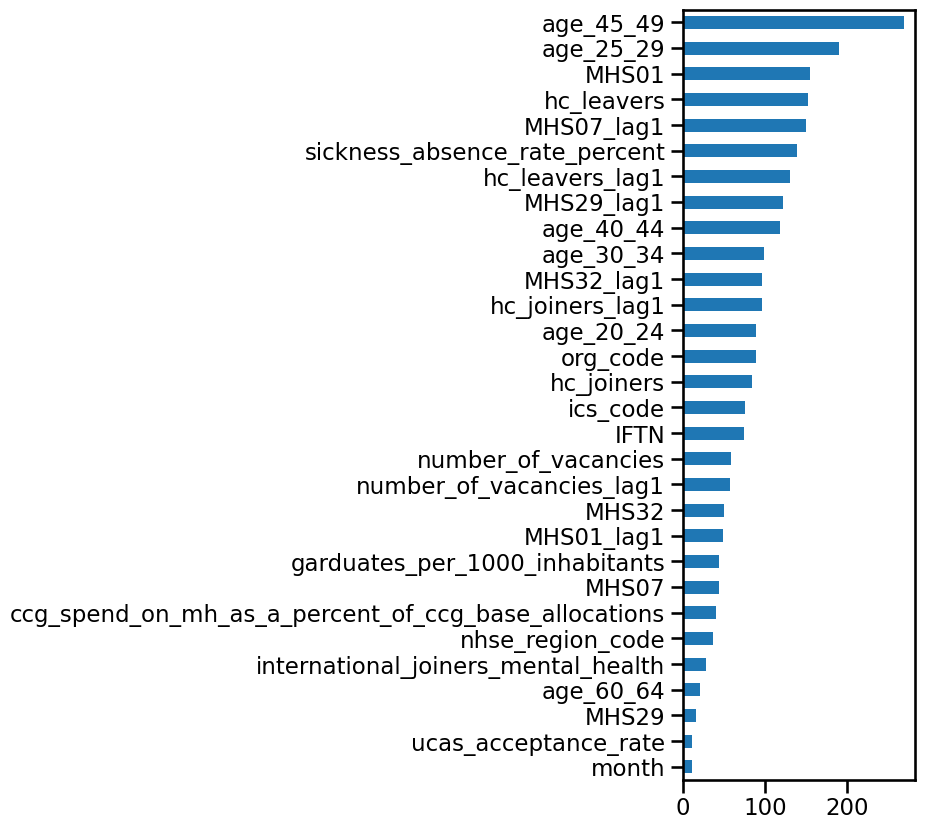

In [111]:
## We will use alpha = 0.1 as it has the highest r squared

model = Lasso(alpha = 0.1)

model.fit(X, y)

feat_importances = pd.Series(index=features, data=model.coef_)

feat_importances.abs().nlargest(30).iloc[::-1].plot(kind="barh", figsize=(3, 10))

In [149]:
top_features = pd.DataFrame(feat_importances.abs().nlargest(30)).reset_index()

In [113]:
## Save results

top_features.to_csv("lasso_features_eng.csv", index=False)

In [302]:
top_features_list = top_features['index'].tolist()

# Build forecast models using Nixtla

## Univariate models

In [ ]:
pip install statsforecast mlforecast neuralforecast s3fs pyarrow

You should consider upgrading via the 'C:\Users\chama\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [115]:
# Load libraries

from statsforecast import StatsForecast

In [116]:
# Rename columns to match the Nixtlaverse's expectations
# The 'org_code' becomes 'unique_id' representing the unique identifier of the time series
# The 'date' becomes 'ds' representing the time stamp of the data points
# The 'hc' becomes 'y' representing the target variable we want to forecast

nurse_df = nurse_tidy[nurse_tidy['year'] <= 2022]

nurse_df = nurse_df[['date','org_code', 'hc']].copy()

nurse_df = nurse_df.rename(columns={
    'org_code': 'unique_id',
    'date': 'ds',
    'hc': 'y'
})

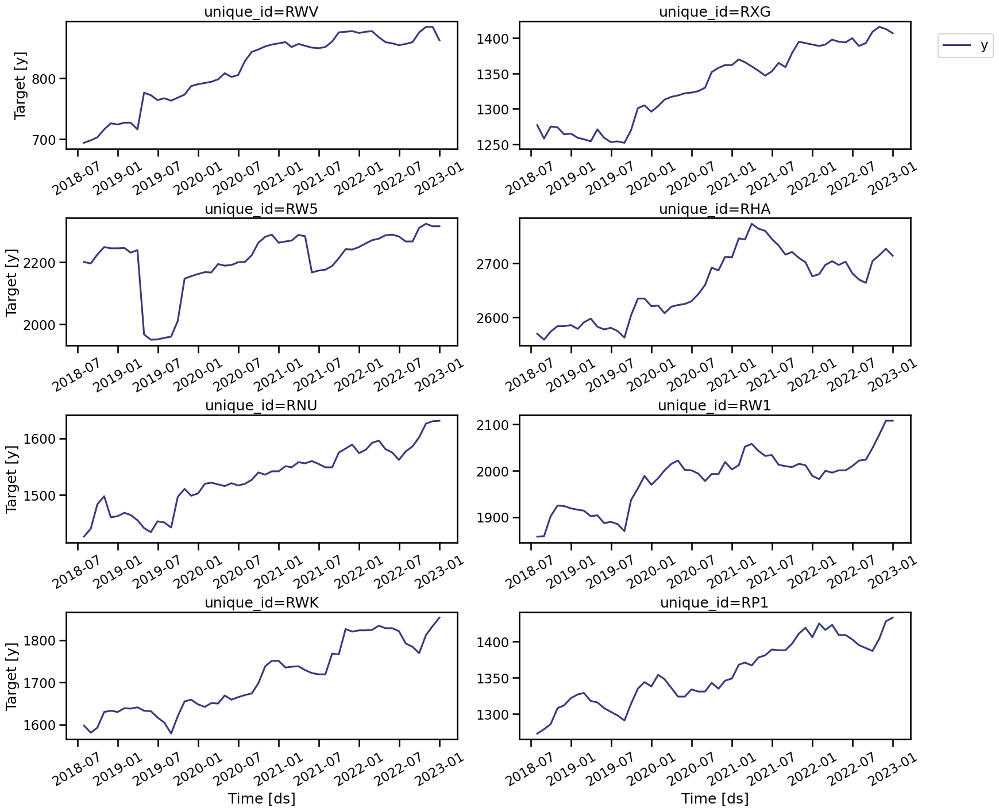

In [ ]:
# Feature: plot random series for EDA

StatsForecast.plot(nurse_df)

In [117]:
# Import necessary models from the statsforecast library
from statsforecast.models import (
    SeasonalNaive,
    AutoARIMA,
    AutoETS
)

In [118]:
# Fit models

horizon = 72

snaive = [
    SeasonalNaive(season_length=12)
]

arima = [
    AutoARIMA(season_length = 12)
]

ets = [
    AutoETS(season_length=12)
]



In [119]:
# Define prediction intervals

levels = [x / 10.0 for x in range(1, 1000, 1)] # confidence levels of the prediction intervals

In [120]:
# Instantiate the StatsForecast class

fit_snaive = StatsForecast(
    models=snaive,  # A list of models to be used for forecasting
    freq='M',  # The frequency of the time series data (in this case, 'D' stands for daily frequency)
    n_jobs=-1,  # The number of CPU cores to use for parallel execution (-1 means use all available cores)
)


fit_arima = StatsForecast(
    models=arima,  # A list of models to be used for forecasting
    freq='M',  # The frequency of the time series data (in this case, 'D' stands for daily frequency)
    n_jobs=-1,  # The number of CPU cores to use for parallel execution (-1 means use all available cores)
)


fit_ets = StatsForecast(
    models=ets,  # A list of models to be used for forecasting
    freq='M',  # The frequency of the time series data (in this case, 'D' stands for daily frequency)
    n_jobs=-1,  # The number of CPU cores to use for parallel execution (-1 means use all available cores)
)


In [121]:
from time import time

# Get the current time before forecasting starts, this will be used to measure the execution time
init = time()

# Call the forecast method of the StatsForecast instance to predict the next 72 months (h=72)

# Level is set to [0.01 - 99.99], which means that it will compute the 0.01 - 90.99% prediction intervals

pred_snaive = fit_snaive.forecast(df = nurse_df, h=72, level=levels)

pred_arima = fit_arima.forecast(df = nurse_df, h=72, level=levels)

pred_ets = fit_ets.forecast(df = nurse_df, h=72, level=levels)


# Get the current time after the forecasting ends
end = time()

C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:440: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\statsforecast\core.py:887: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  fcsts_df[cols] = fcsts
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\statsforecast\core.

In [ ]:
# Calculate and print the total time taken for the forecasting in minutes
print(f'Forecast Minutes: {(end - init) / 60}')

Forecast Minutes: 0.521939202149709


In [122]:
pred_snaive

,unique_id,ds,SeasonalNaive,SeasonalNaive-lo-0.1,SeasonalNaive-lo-0.2,SeasonalNaive-lo-0.3,SeasonalNaive-lo-0.4,SeasonalNaive-lo-0.5,SeasonalNaive-lo-0.6,SeasonalNaive-lo-0.7,...,SeasonalNaive-hi-99.0,SeasonalNaive-hi-99.1,SeasonalNaive-hi-99.2,SeasonalNaive-hi-99.3,SeasonalNaive-hi-99.4,SeasonalNaive-hi-99.5,SeasonalNaive-hi-99.6,SeasonalNaive-hi-99.7,SeasonalNaive-hi-99.8,SeasonalNaive-hi-99.9
0,R1L,2023-01-31,1643.0,1642.901733,1642.803467,1642.705200,1642.606934,1642.508667,1642.410400,1642.312134,...,1844.947998,1847.787964,1850.925293,1854.435669,1858.429199,1863.074585,1868.651123,1875.674072,1885.277710,1900.981079
1,R1L,2023-02-28,1643.0,1642.901733,1642.803467,1642.705200,1642.606934,1642.508667,1642.410400,1642.312134,...,1844.947998,1847.787964,1850.925293,1854.435669,1858.429199,1863.074585,1868.651123,1875.674072,1885.277710,1900.981079
2,R1L,2023-03-31,1649.0,1648.901733,1648.803467,1648.705200,1648.606934,1648.508667,1648.410400,1648.312134,...,1850.947998,1853.787964,1856.925293,1860.435669,1864.429199,1869.074585,1874.651123,1881.674072,1891.277710,1906.981079
3,R1L,2023-04-30,1636.0,1635.901733,1635.803467,1635.705200,1635.606934,1635.508667,1635.410400,1635.312134,...,1837.947998,1840.787964,1843.925293,1847.435669,1851.429199,1856.074585,1861.651123,1868.674072,1878.277710,1893.981079
4,R1L,2023-05-31,1637.0,1636.901733,1636.803467,1636.705200,1636.606934,1636.508667,1636.410400,1636.312134,...,1838.947998,1841.787964,1844.925293,1848.435669,1852.429199,1857.074585,1862.651123,1869.674072,1879.277710,1894.981079
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3235,TAJ,2028-08-31,1063.0,1062.923706,1062.847412,1062.771118,1062.694824,1062.618530,1062.542236,1062.465942,...,1219.781372,1221.986206,1224.421875,1227.147095,1230.247437,1233.853882,1238.183228,1243.635376,1251.091187,1263.282349
3236,TAJ,2028-09-30,1063.0,1062.923706,1062.847412,1062.771118,1062.694824,1062.618530,1062.542236,1062.465942,...,1219.781372,1221.986206,1224.421875,1227.147095,1230.247437,1233.853882,1238.183228,1243.635376,1251.091187,1263.282349
3237,TAJ,2028-10-31,1072.0,1071.923706,1071.847412,1071.771118,1071.694824,1071.618530,1071.542236,1071.465942,...,1228.781372,1230.986206,1233.421875,1236.147095,1239.247437,1242.853882,1247.183228,1252.635376,1260.091187,1272.282349
3238,TAJ,2028-11-30,1076.0,1075.923706,1075.847412,1075.771118,1075.694824,1075.618530,1075.542236,1075.465942,...,1232.781372,1234.986206,1237.421875,1240.147095,1243.247437,1246.853882,1251.183228,1256.635376,1264.091187,1276.282349


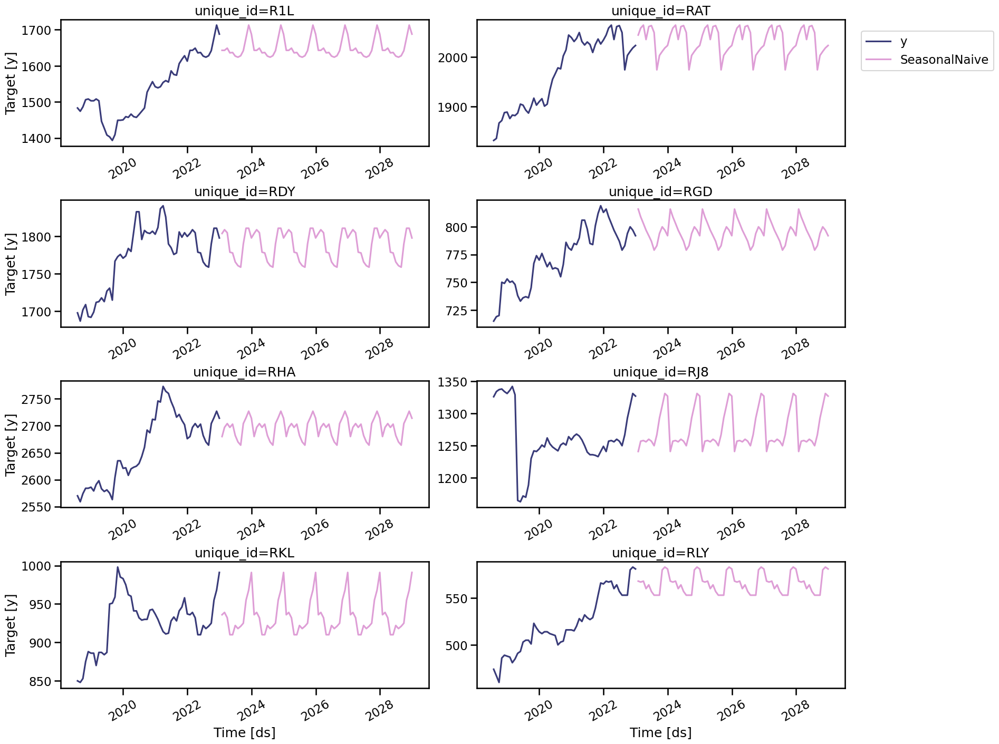

In [123]:
#Plot prediction intervals

##SeasonalNaive

fit_snaive.plot(nurse_df, pred_snaive, plot_random = False)

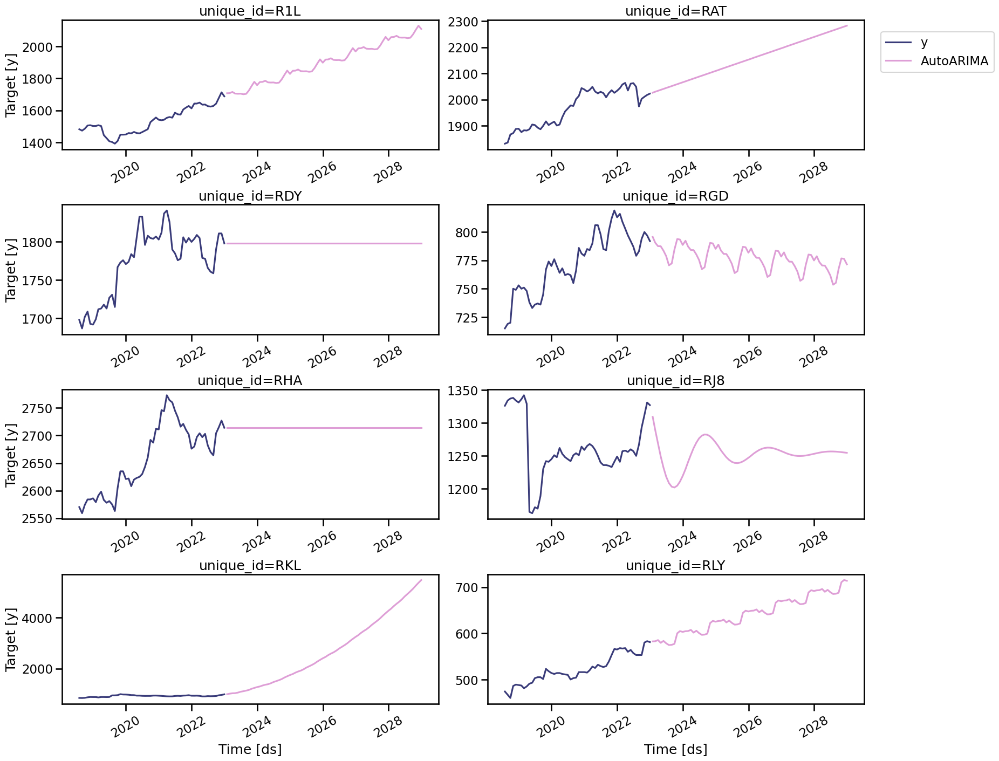

In [ ]:
##ARIMA

fit_arima.plot(nurse_df, pred_arima, plot_random = False)

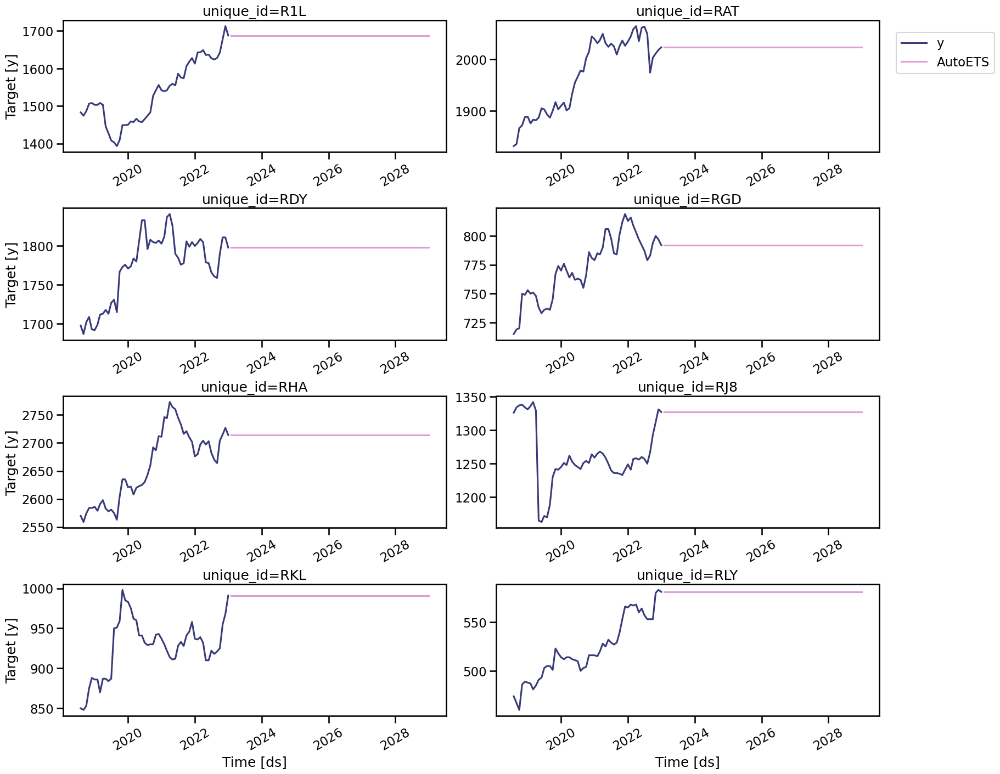

In [ ]:
##ets

fit_ets.plot(nurse_df, pred_ets, plot_random = False)

In [124]:
## Save results

pred_snaive.to_csv("results/pred_snaive_eng.csv", index=False)
pred_arima.to_csv("results/pred_arima_eng.csv", index=False)
pred_ets.to_csv("results/pred_ets_eng.csv", index=False)

## ML models

In [78]:
pip install window_ops

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\Users\chama\AppData\Local\Programs\Python\Python310\python.exe -m pip install --upgrade pip' command.


In [80]:
pip install lightgbm xgboost sklearn

Using legacy 'setup.py install' for sklearn, since package 'wheel' is not installed.
    Running setup.py install for sklearn: started
    Running setup.py install for sklearn: finished with status 'done'
Note: you may need to restart the kernel to use updated packages.


    ERROR: Command errored out with exit status 1:
     command: 'C:\Users\chama\AppData\Local\Programs\Python\Python310\python.exe' -c 'import io, os, sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\chama\\AppData\\Local\\Temp\\pip-install-626mscn7\\sklearn_84eddd8865a348978494a4370bec184b\\setup.py'"'"'; __file__='"'"'C:\\Users\\chama\\AppData\\Local\\Temp\\pip-install-626mscn7\\sklearn_84eddd8865a348978494a4370bec184b\\setup.py'"'"';f = getattr(tokenize, '"'"'open'"'"', open)(__file__) if os.path.exists(__file__) else io.StringIO('"'"'from setuptools import setup; setup()'"'"');code = f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' egg_info --egg-base 'C:\Users\chama\AppData\Local\Temp\pip-pip-egg-info-3z6m2zjy'
         cwd: C:\Users\chama\AppData\Local\Temp\pip-install-626mscn7\sklearn_84eddd8865a348978494a4370bec184b\
    Complete output (15 lines):
    The 'sklearn' PyPI package is deprecated, use 'scikit-learn'
  

In [81]:
## Load libraries

from mlforecast import MLForecast
from mlforecast.target_transforms import Differences
from mlforecast.utils import PredictionIntervals
from window_ops.expanding import expanding_mean
from window_ops.rolling import rolling_mean

from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression


Normal scenario

In [303]:

nurse_base = nurse_tidy.drop(nurse_tidy_t.iloc[:, 44:61],axis = 1)
nurse_base['covid_index'] = np.where(nurse_base['year'] == 2020, 1, 0)
nurse_base

,date,year,month,org_code,nhse_region_code,ics_code,hc,hc_leavers,hc_joiners,hc_leavers_lag1,...,age_50_54,age_55_59,age_60_64,SFTN,IFTN,ucas_acceptance_rate,ucas_acceptance_lag4,international_joiners_mental_health,time_window,covid_index
0,2018-07-31,2018,7,R1L,Y61,QH8,1483,19.000000,8.000000,0.000000,...,4360366,3976862,3391759,14.90,500.750000,-12.500000,21.670000,13,0,0
1,2018-07-31,2018,7,RAT,Y56,QMF,1832,18.000000,23.000000,0.000000,...,564205,479470,378068,14.90,500.750000,4.170000,0.000000,13,0,0
2,2018-07-31,2018,7,RDY,Y58,QVV,1698,17.000000,6.000000,0.000000,...,402594,379723,338670,14.90,500.750000,15.790000,14.290000,13,0,0
3,2018-07-31,2018,7,RGD,Y63,QWO,715,6.000000,9.000000,0.000000,...,571347,541354,473053,14.90,500.750000,17.320000,-6.000000,13,0,0
4,2018-07-31,2018,7,RHA,Y60,QT1,2570,23.000000,11.000000,0.000000,...,752739,688304,590748,14.90,500.750000,0.000000,10.320000,13,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5665,2028-12-31,2028,12,RXV,Y62,QOP,0,11.997386,38.868463,26.038160,...,416288,487126,498320,17.15,1037.247826,37.695996,37.572765,44,125,0
5666,2028-12-31,2028,12,RXX,Y59,QXU,0,9.186565,11.129800,9.234847,...,583068,629188,635383,17.15,1037.247826,37.700745,37.700745,44,125,0
5667,2028-12-31,2028,12,RXY,Y59,QKS,0,14.963166,15.299166,14.565710,...,583068,629188,635383,17.15,1037.247826,37.700745,37.700745,44,125,0
5668,2028-12-31,2028,12,RYG,Y60,QWU,0,17.787330,22.394072,18.160520,...,629911,728994,740441,17.15,1037.247826,59.798953,59.798953,44,125,0


In [304]:
nurse_base['static_id'] = nurse_base['org_code']  # to use the id as a static feature as well

In [305]:
# Category encoders's encoder replaces the categories
# with integers, in place, returning a dataframe with the original
# and encoded variables, by default.

# convert categorical features - for ML models

# Set up the ordinal encoder

o_enc = OrdinalEncoder()

o_enc.fit(nurse_base[['nhse_region_code', 'ics_code', 'static_id']])

nurse_base[['nhse_region_code', 'ics_code', 'static_id']] = o_enc.transform(nurse_base[['nhse_region_code', 'ics_code', 'static_id']])

In [306]:
## train is the historic data, test is the future values of predictors

train = nurse_base[nurse_base['year'] <= 2022]

test = nurse_base[nurse_base['year'] > 2022]

In [307]:
### Update top features list

key_features = ['date','hc', 'covid_index']

top_features_list.extend(key_features)

top_features_list.remove('month')  ## we will add month using the ml model time features

In [308]:
top_features_list

['age_45_49',
 'age_25_29',
 'MHS01',
 'hc_leavers',
 'MHS07_lag1',
 'sickness_absence_rate_percent',
 'hc_leavers_lag1',
 'MHS29_lag1',
 'age_40_44',
 'age_30_34',
 'MHS32_lag1',
 'hc_joiners_lag1',
 'age_20_24',
 'org_code',
 'hc_joiners',
 'ics_code',
 'IFTN',
 'number_of_vacancies',
 'number_of_vacancies_lag1',
 'MHS32',
 'MHS01_lag1',
 'garduates_per_1000_inhabitants',
 'MHS07',
 'ccg_spend_on_mh_as_a_percent_of_ccg_base_allocations',
 'nhse_region_code',
 'international_joiners_mental_health',
 'age_60_64',
 'MHS29',
 'ucas_acceptance_rate',
 'date',
 'hc',
 'covid_index']

In [309]:
### Prepare Train dataset

nurse_df_train = train[top_features_list].copy()


nurse_df_train = nurse_df_train. rename(columns={
    'org_code': 'unique_id',
    'date': 'ds',
    'hc': 'y'
})

In [310]:
### Prepare Future dataset

nurse_df_future = test[top_features_list].copy()


nurse_df_future = nurse_df_future. rename(columns={
    'org_code': 'unique_id',
    'date': 'ds',
    'hc': 'y'
})

In [311]:
### scaling features

key_features = ['date', 'org_code', 'ics_code', 'static_id', 'hc', 'covid_index']

## remove org code, hc

top_features_list = list(set(top_features_list) - set(key_features))

In [312]:
## scaling training values

ss = StandardScaler()

nurse_df_train[top_features_list] = ss.fit_transform(nurse_df_train[top_features_list])

In [313]:
## scaling future values

nurse_df_future[top_features_list] = ss.fit_transform(nurse_df_future[top_features_list])

nurse_df_future_variables = nurse_df_future.drop(['y'], axis = 1)

In [314]:
## lgb, xgb models

model_params = {
    'n_estimators': 1000,
    'max_depth': 4,
    'learning_rate': 0.1,
}


lgbm = MLForecast(
    models=[LGBMRegressor(**model_params)],
    freq='M',
    #lags=[1],
    #lag_transforms = {
        #1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 day
    #},
    date_features=['month', 'year', 'quarter'],  # Date features to use as regressors

    num_threads=4,

)


xgbm = MLForecast(
    models=[XGBRegressor(**model_params),],
    freq='M',
    #lags=[1],
    #lag_transforms = {
       # 1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 day
   # },
    date_features=['month', 'year', 'quarter'],  # Date features to use as regressors

    num_threads=4,

)

In [317]:
## lgbm model

lgbm.fit(
    nurse_df_train,
    static_features=['nhse_region_code', 'ics_code'],
    prediction_intervals=PredictionIntervals()
)

C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000598 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2990
[LightGBM] [Info] Number of data points in the train set: 2340, number of used features: 32
[LightGBM] [Info] Start training from score 1363.770085
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_o

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000421 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2994
[LightGBM] [Info] Number of data points in the train set: 2430, number of used features: 32
[LightGBM] [Info] Start training from score 1365.891770
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

MLForecast(models=[LGBMRegressor], freq=M, lag_features=[], date_features=['month', 'year', 'quarter'], num_threads=4)

In [318]:
## xgbm model

xgbm.fit(
    nurse_df_train,
    static_features=['nhse_region_code', 'ics_code'],
    prediction_intervals=PredictionIntervals()
)

C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_o

MLForecast(models=[XGBRegressor], freq=M, lag_features=[], date_features=['month', 'year', 'quarter'], num_threads=4)

In [319]:
## forecastig for all prediction intervals

nurse_df_future_variables.drop(columns=['ics_code', 'nhse_region_code'], errors='ignore', inplace=True)

# Define prediction intervals

levels = [x / 10.0 for x in range(1, 1000, 1)] # confidence levels of the prediction intervals

pred_lgbm = lgbm.predict(72, X_df=nurse_df_future_variables, level=levels)

pred_xgbm = xgbm.predict(72, X_df=nurse_df_future_variables, level=levels)

C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_o

## Linear Regression

In [172]:
## LM model

lm = MLForecast(
    models=[LinearRegression()],
    freq='M',
    #lags=[1],
    #lag_transforms = {
    #    1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 month
    #},
    date_features=['month', 'quarter', 'year'],

)

In [180]:
## lm model

lm.fit(
    nurse_df_train,
    static_features=['nhse_region_code', 'ics_code'],
    prediction_intervals=PredictionIntervals()
)

C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_o

MLForecast(models=[LinearRegression], freq=M, lag_features=[], date_features=['month', 'quarter', 'year'], num_threads=1)

In [181]:
## forecastig for all prediction intervals

# Define prediction intervals

levels = [x / 10.0 for x in range(1, 1000, 1)] # confidence levels of the prediction intervals

pred_lm = lm.predict(72, X_df=nurse_df_future_variables, level=levels)

C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_o

In [320]:
## Save results

pred_lm.to_csv("results/pred_lm_eng.csv", index=False)

pred_lgbm.to_csv("results/pred_lgbm_eng.csv", index=False)

pred_xgbm.to_csv("results/pred_xgbm_eng.csv", index=False)

High demand model

In [321]:
## drop patient related normal and low scenarios

nurse_high = nurse_tidy.drop(["MHS32", "MHS01", "MHS07", "MHS29",
                              "MHS32_lag1", "MHS01_lag1", "MHS07_lag1", "MHS29_lag1",
                              "MHS32_low", "MHS01_low", "MHS07_low", "MHS29_low",
                              "MHS32_low_lag1", "MHS01_low_lag1", "MHS07_low_lag1", "MHS29_low_lag1",],axis = 1)

nurse_high['covid_index'] = np.where(nurse_base['year'] == 2020, 1, 0)

nurse_high

,date,year,month,org_code,nhse_region_code,ics_code,hc,hc_leavers,hc_joiners,hc_leavers_lag1,...,time_window,MHS32_high,MHS32_high_lag1,MHS01_high,MHS01_high_lag1,MHS07_high,MHS07_high_lag1,MHS29_high,MHS29_high_lag1,covid_index
0,2018-07-31,2018,7,R1L,Y61,QH8,1483,19.000000,8.000000,0.000000,...,0,7720.000000,6985.000000,28535.000000,28145.000000,550.000000,555.000000,35670.000000,34880.000000,0
1,2018-07-31,2018,7,RAT,Y56,QMF,1832,18.000000,23.000000,0.000000,...,0,8540.000000,8640.000000,36085.000000,36180.000000,220.000000,230.000000,59050.000000,57740.000000,0
2,2018-07-31,2018,7,RDY,Y58,QVV,1698,17.000000,6.000000,0.000000,...,0,3780.000000,3895.000000,15460.000000,15440.000000,340.000000,340.000000,27705.000000,27695.000000,0
3,2018-07-31,2018,7,RGD,Y63,QWO,715,6.000000,9.000000,0.000000,...,0,2645.000000,2500.000000,15465.000000,15685.000000,355.000000,350.000000,29535.000000,27495.000000,0
4,2018-07-31,2018,7,RHA,Y60,QT1,2570,23.000000,11.000000,0.000000,...,0,6805.000000,6835.000000,22020.000000,21815.000000,860.000000,865.000000,35495.000000,35555.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5665,2028-12-31,2028,12,RXV,Y62,QOP,0,11.997386,38.868463,26.038160,...,125,14331.363882,15311.715171,40026.516568,40726.138897,1130.830684,1152.414579,118920.060951,129320.888285,0
5666,2028-12-31,2028,12,RXX,Y59,QXU,0,9.186565,11.129800,9.234847,...,125,7551.314630,8988.541126,41463.630277,41453.423723,122.588318,120.531753,29449.005157,33785.290983,0
5667,2028-12-31,2028,12,RXY,Y59,QKS,0,14.963166,15.299166,14.565710,...,125,10009.104532,11365.333635,20584.035675,20692.748748,298.533704,289.518539,50800.023249,63130.762792,0
5668,2028-12-31,2028,12,RYG,Y60,QWU,0,17.787330,22.394072,18.160520,...,125,4644.696732,5382.720379,7617.703661,7617.703661,105.336241,103.279676,25762.424223,30916.104792,0


In [322]:
nurse_high['static_id'] = nurse_high['org_code']  # to use the id as a static feature as well

In [323]:
# Category encoders's encoder replaces the categories
# with integers, in place, returning a dataframe with the original
# and encoded variables, by default.

# convert categorical features - for ML models

# Set up the ordinal encoder

o_enc = OrdinalEncoder()

o_enc.fit(nurse_high[['nhse_region_code', 'ics_code', 'static_id']])

nurse_high[['nhse_region_code', 'ics_code', 'static_id']] = o_enc.transform(nurse_high[['nhse_region_code', 'ics_code', 'static_id']])


In [324]:
## train is the historic data, test is the future values of predictors

train = nurse_high[nurse_high['year'] <= 2022]

test = nurse_high[nurse_high['year'] > 2022]


In [325]:
### Update top features list

key_features = ['date','hc', 'org_code', 'ics_code', 'MHS32_high_lag1', 'MHS29_high_lag1', 'MHS29_high', 'MHS32_high', 'MHS01_high_lag1', 'MHS07_high_lag1', 'MHS01_high', 'MHS07_high', 'covid_index']

old_features = ['MHS32_lag1', 'MHS29_lag1', 'MHS29', 'MHS32', 'MHS01_lag1', 'MHS07_lag1', 'MHS01', 'MHS07']

top_features_list = list(set(top_features_list) - set(old_features))

top_features_list.extend(key_features)

#top_features_list.remove('month')  ## we will add month using the ml model time features

In [326]:
### Prepare Train dataset

nurse_df_train = train[top_features_list].copy()

nurse_df_train = nurse_df_train. rename(columns={
    'org_code': 'unique_id',
    'date': 'ds',
    'hc': 'y'
})

In [327]:
### Prepare Future dataset

nurse_df_future = test[top_features_list].copy()

nurse_df_future = nurse_df_future. rename(columns={
    'org_code': 'unique_id',
    'date': 'ds',
    'hc': 'y'
})


In [328]:
### scaling features

key_features = ['date', 'org_code', 'hc', 'covid_index']

## remove org code, hc

top_features_list = list(set(top_features_list) - set(key_features))



In [329]:
## scaling training values

ss = StandardScaler()

nurse_df_train[top_features_list] = ss.fit_transform(nurse_df_train[top_features_list])

In [330]:
## scaling future values

nurse_df_future[top_features_list] = ss.fit_transform(nurse_df_future[top_features_list])

nurse_df_future_variables = nurse_df_future.drop(['y'], axis = 1)


In [331]:
## lgb, xgb models

model_params = {
    'n_estimators': 1000,
    'max_depth': 4,
    'learning_rate': 0.1,
}

lgbm = MLForecast(
    models=[LGBMRegressor(**model_params)],
    freq='M',
    #lags=[1],
    #lag_transforms = {
    #    1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 day
    #},
    date_features=['month', 'year', 'quarter'],  # Date features to use as regressors

    num_threads=4,

)

xgbm = MLForecast(
    models=[XGBRegressor(**model_params),],
    freq='M',
    #lags=[1],
    #lag_transforms = {
    #    1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 day
    #},
    date_features=['month', 'year', 'quarter'],  # Date features to use as regressors

    num_threads=4,

)


In [333]:
## lgbm model

lgbm.fit(
    nurse_df_train,
    static_features=['nhse_region_code', 'ics_code'],
    prediction_intervals=PredictionIntervals()
)


C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000683 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2990
[LightGBM] [Info] Number of data points in the train set: 2340, number of used features: 32
[LightGBM] [Info] Start training from score 1363.770085
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_o

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2994
[LightGBM] [Info] Number of data points in the train set: 2430, number of used features: 32
[LightGBM] [Info] Start training from score 1365.891770
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

MLForecast(models=[LGBMRegressor], freq=M, lag_features=[], date_features=['month', 'year', 'quarter'], num_threads=4)

In [334]:
## xgbm model

xgbm.fit(
    nurse_df_train,
    static_features=['nhse_region_code', 'ics_code'],
    prediction_intervals=PredictionIntervals()
)


C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_o

MLForecast(models=[XGBRegressor], freq=M, lag_features=[], date_features=['month', 'year', 'quarter'], num_threads=4)

In [355]:
## forecastig for all prediction intervals

nurse_df_future_variables.drop(columns=['ics_code', 'nhse_region_code'], errors='ignore', inplace=True)

# Define prediction intervals

levels = [x / 10.0 for x in range(1, 1000, 1)] # confidence levels of the prediction intervals

pred_lgbm_high = lgbm.predict(72, X_df=nurse_df_future_variables, level=levels)

pred_xgbm_high = xgbm.predict(72, X_df=nurse_df_future_variables, level=levels)


C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_o

In [337]:
## LM model

lm = MLForecast(
    models=[LinearRegression()],
    freq='M',
    #lags=[1],
    #lag_transforms = {
    #    1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 month
    #},
    date_features=['month', 'quarter', 'year', 'week'],

)


In [338]:
## lm model

lm.fit(
    nurse_df_train,
    static_features = ['ics_code', 'nhse_region_code'],
    prediction_intervals=PredictionIntervals()
)


C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_o

MLForecast(models=[LinearRegression], freq=M, lag_features=[], date_features=['month', 'quarter', 'year', 'week'], num_threads=1)

In [339]:
## forecastig for all prediction intervals

# Define prediction intervals

levels = [x / 10.0 for x in range(1, 1000, 1)] # confidence levels of the prediction intervals

pred_lm_high = lm.predict(72, X_df=nurse_df_future_variables, level=levels)


C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_o

In [340]:
## Save results

pred_lm_high.to_csv("results/pred_lm_high_eng.csv", index=False)

pred_lgbm_high.to_csv("results/pred_lgbm_high_eng.csv", index=False)

pred_xgbm_high.to_csv("results/pred_xgbm_high_eng.csv", index=False)


Low demand model

In [342]:
## drop patient related normal and high scenarios

nurse_low = nurse_tidy.drop(["MHS32", "MHS01", "MHS07", "MHS29",
                              "MHS32_lag1", "MHS01_lag1", "MHS07_lag1", "MHS29_lag1",
                              "MHS32_high", "MHS01_high", "MHS07_high", "MHS29_high",
                              "MHS32_high_lag1", "MHS01_high_lag1", "MHS07_high_lag1", "MHS29_high_lag1",],axis = 1)

nurse_low['covid_index'] = np.where(nurse_low['year'] == 2020, 1, 0)

nurse_low

,date,year,month,org_code,nhse_region_code,ics_code,hc,hc_leavers,hc_joiners,hc_leavers_lag1,...,time_window,MHS32_low,MHS32_low_lag1,MHS01_low,MHS01_low_lag1,MHS07_low,MHS07_low_lag1,MHS29_low,MHS29_low_lag1,covid_index
0,2018-07-31,2018,7,R1L,Y61,QH8,1483,19.000000,8.000000,0.000000,...,0,7720.000000,6985.000000,28535.000000,28145.000000,550.000000,555.000000,35670.000000,34880.000000,0
1,2018-07-31,2018,7,RAT,Y56,QMF,1832,18.000000,23.000000,0.000000,...,0,8540.000000,8640.000000,36085.000000,36180.000000,220.000000,230.000000,59050.000000,57740.000000,0
2,2018-07-31,2018,7,RDY,Y58,QVV,1698,17.000000,6.000000,0.000000,...,0,3780.000000,3895.000000,15460.000000,15440.000000,340.000000,340.000000,27705.000000,27695.000000,0
3,2018-07-31,2018,7,RGD,Y63,QWO,715,6.000000,9.000000,0.000000,...,0,2645.000000,2500.000000,15465.000000,15685.000000,355.000000,350.000000,29535.000000,27495.000000,0
4,2018-07-31,2018,7,RHA,Y60,QT1,2570,23.000000,11.000000,0.000000,...,0,6805.000000,6835.000000,22020.000000,21815.000000,860.000000,865.000000,35495.000000,35555.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5665,2028-12-31,2028,12,RXV,Y62,QOP,0,11.997386,38.868463,26.038160,...,125,12205.681575,13186.032864,34247.855701,34947.478031,1066.577231,1088.161126,109016.224665,119417.051999,0
5666,2028-12-31,2028,12,RXX,Y59,QXU,0,9.186565,11.129800,9.234847,...,125,4780.195973,6217.422470,36075.009993,36064.803439,116.665816,114.609251,15162.237190,19498.523016,0
5667,2028-12-31,2028,12,RXY,Y59,QKS,0,14.963166,15.299166,14.565710,...,125,8480.034912,9836.264015,19895.386435,20004.099507,233.359037,224.343871,46043.362915,58374.102458,0
5668,2028-12-31,2028,12,RYG,Y60,QWU,0,17.787330,22.394072,18.160520,...,125,3351.008688,4089.032335,-4248.434706,-4248.434706,9.509253,7.452689,18308.031428,23461.711996,0


In [343]:
nurse_low['static_id'] = nurse_low['org_code']  # to use the id as a static feature as well

In [344]:
# Category encoders's encoder replaces the categories
# with integers, in place, returning a dataframe with the original
# and encoded variables, by default.

# convert categorical features - for ML models

# Set up the ordinal encoder

o_enc = OrdinalEncoder()

o_enc.fit(nurse_low[['nhse_region_code', 'ics_code', 'static_id']])

nurse_low[['nhse_region_code', 'ics_code', 'static_id']] = o_enc.transform(nurse_low[['nhse_region_code', 'ics_code', 'static_id']])


In [345]:
## train is the historic data, test is the future values of predictors

train = nurse_low[nurse_low['year'] <= 2022]

test = nurse_low[nurse_low['year'] > 2022]


In [346]:
## Update top features list

key_features = ['date','hc', 'org_code', 'MHS32_low_lag1', 'MHS29_low_lag1', 'MHS29_low', 'MHS32_low', 'MHS01_low_lag1', 'MHS07_low_lag1', 'MHS01_low', 'MHS07_low', 'covid_index']

old_features = ['MHS32_high_lag1', 'MHS29_high_lag1', 'MHS29_high', 'MHS32_high', 'MHS01_high_lag1', 'MHS07_high_lag1', 'MHS01_high', 'MHS07_high']

top_features_list = list(set(top_features_list) - set(old_features))

top_features_list.extend(key_features)

#top_features_list.remove('month')  ## we will add month using the ml model time features

In [347]:
### Prepare Train dataset

nurse_df_train = train[top_features_list].copy()

nurse_df_train = nurse_df_train. rename(columns={
    'org_code': 'unique_id',
    'date': 'ds',
    'hc': 'y'
})


In [348]:
### Prepare Future dataset

nurse_df_future = test[top_features_list].copy()

nurse_df_future = nurse_df_future. rename(columns={
    'org_code': 'unique_id',
    'date': 'ds',
    'hc': 'y'
})


In [349]:
### scaling features

key_features = ['date', 'org_code', 'hc', 'covid_index']

## remove org code, hc

top_features_list = list(set(top_features_list) - set(key_features))


In [350]:
## scaling training values

ss = StandardScaler()

nurse_df_train[top_features_list] = ss.fit_transform(nurse_df_train[top_features_list])


In [351]:
## scaling future values

nurse_df_future[top_features_list] = ss.fit_transform(nurse_df_future[top_features_list])

nurse_df_future_variables = nurse_df_future.drop(['y'], axis = 1)


In [352]:
## lgb, xgb models

model_params = {
    'n_estimators': 1000,
    'max_depth': 4,
    'learning_rate': 0.1,
}

lgbm = MLForecast(
    models=[LGBMRegressor(**model_params)],
    freq='M',
    #lags=[1],
    #lag_transforms = {
    #    1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 day
    #},
    date_features=['month'],  # Date features to use as regressors

    num_threads=4,

)

xgbm = MLForecast(
    models=[XGBRegressor(**model_params),],
    freq='M',
    #lags=[1],
    #lag_transforms = {
    #    1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 day
    #},
    date_features=['month'],  # Date features to use as regressors

    num_threads=4,

)


In [353]:
## lgbm model

lgbm.fit(
    nurse_df_train,
    static_features=['nhse_region_code', 'ics_code'],
    prediction_intervals=PredictionIntervals()
)


C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000613 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2979
[LightGBM] [Info] Number of data points in the train set: 2340, number of used features: 30
[LightGBM] [Info] Start training from score 1363.770085
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_o

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000444 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2983
[LightGBM] [Info] Number of data points in the train set: 2430, number of used features: 30
[LightGBM] [Info] Start training from score 1365.891770
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

MLForecast(models=[LGBMRegressor], freq=M, lag_features=[], date_features=['month'], num_threads=4)

In [354]:
## xgbm model

xgbm.fit(
    nurse_df_train,
    static_features=['nhse_region_code', 'ics_code'],
    prediction_intervals=PredictionIntervals()
)


C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_o

MLForecast(models=[XGBRegressor], freq=M, lag_features=[], date_features=['month'], num_threads=4)

In [357]:
## forecastig for all prediction intervals

nurse_df_future_variables.drop(columns=['ics_code', 'nhse_region_code'], errors='ignore', inplace=True)

# Define prediction intervals

levels = [x / 10.0 for x in range(1, 1000, 1)] # confidence levels of the prediction intervals

%time

pred_lgbm_low = lgbm.predict(72, X_df=nurse_df_future_variables, level=levels)

pred_xgbm_low = xgbm.predict(72, X_df=nurse_df_future_variables, level=levels)


CPU times: total: 0 ns
Wall time: 0 ns


C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_o

In [358]:
## LM model

lm = MLForecast(
    models=[LinearRegression()],
    freq='M',
    #lags=[1],
    #lag_transforms = {
    #    1:  [expanding_mean],  # Apply expanding mean transformation to the lag of 1 month
    #},
    date_features=['month', 'year', 'quarter'],

)


In [359]:
## lm model

lm.fit(
    nurse_df_train,
    static_features = ['ics_code', 'nhse_region_code'],
    prediction_intervals=PredictionIntervals()
)


C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_o

MLForecast(models=[LinearRegression], freq=M, lag_features=[], date_features=['month', 'year', 'quarter'], num_threads=1)

In [360]:
## forecastig for all prediction intervals

# Define prediction intervals

levels = [x / 10.0 for x in range(1, 1000, 1)] # confidence levels of the prediction intervals

pred_lm_low = lm.predict(72, X_df=nurse_df_future_variables, level=levels)


C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_offset(freq)
C:\Users\chama\AppData\Local\Programs\Python\Python310\lib\site-packages\utilsforecast\processing.py:384: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  freq = pd.tseries.frequencies.to_o

In [ ]:
## Save results

pred_lm_low.to_csv("results/pred_lm_low_eng.csv", index=False)

pred_lgbm_low.to_csv("results/pred_lgbm_low_eng.csv", index=False)

pred_xgbm_low.to_csv("results/pred_xgbm_low_eng.csv", index=False)